In [ ]:
import os
import sys

import cv2

import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

import torch.nn.functional as F
import torch
import torch.nn as nn
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from torchvision import models, transforms

from PIL import Image

import joblib

# Get path to project root (assuming notebook is in notebooks/)
PROJECT_ROOT = os.path.abspath(os.path.join(os.getcwd(), ".."))
SCRIPTS_DIR = os.path.join(PROJECT_ROOT, "scripts")
MODELS_DIR = os.path.join(PROJECT_ROOT, "models")

# Add to sys.path
if SCRIPTS_DIR not in sys.path:
    sys.path.append(SCRIPTS_DIR)

from utils import load_data, image_path

# Load data
X_train, y_train, X_test = load_data()
labels = pd.read_csv(os.path.join(PROJECT_ROOT, "data", "prdtypecode_labels.csv"), index_col=0)
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train)

y_train = y_train.merge(labels, on="prdtypecode", how="left")

/home/cramarokoto/miniconda3/envs/py311/lib/python3.11/site-packages/sklearn/preprocessing/_label.py:110: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
import os
import sys

import cv2

import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

import torch.nn.functional as F
import torch
import torch.nn as nn
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from torchvision import models, transforms

from PIL import Image

import joblib

# Get path to project root (assuming notebook is in notebooks/)
PROJECT_ROOT = os.path.abspath(os.path.join(os.getcwd(), ".."))
SCRIPTS_DIR = os.path.join(PROJECT_ROOT, "scripts")
MODELS_DIR = os.path.join(PROJECT_ROOT, "models")

# Add to sys.path
if SCRIPTS_DIR not in sys.path:
    sys.path.append(SCRIPTS_DIR)

from utils import load_data, image_path

# Load data
X_train, y_train, X_test = load_data()
labels = pd.read_csv(os.path.join(PROJECT_ROOT, "data", "prdtypecode_labels.csv"), index_col=0)
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train)

y_train = y_train.merge(labels, on="prdtypecode", how="left")

# Resnet model interpretability

Afin de vérifier la capacité du modèle à classifier les images en utilisant des données utiles, nous étudions l'interprétabilité du modèle via un grad cam.

Nous observons les limitations du modèle :
- certains objets sont reconnus en tant que tel mais leur catégorie est mauvaise car ils peuvent appartenir à plusieurs catégories naturellement
- certains objets sont mal représentés dans les images (par exemple lot de cartouches de jeu trop dense)
- certaines catégories se basent plus sur l'environnement que sur l'objet (par exemple pour les articles de jardinage), ce qui n'est pas stable et forcément discriminant

/tmp/ipykernel_204699/94095849.py:3: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(1))


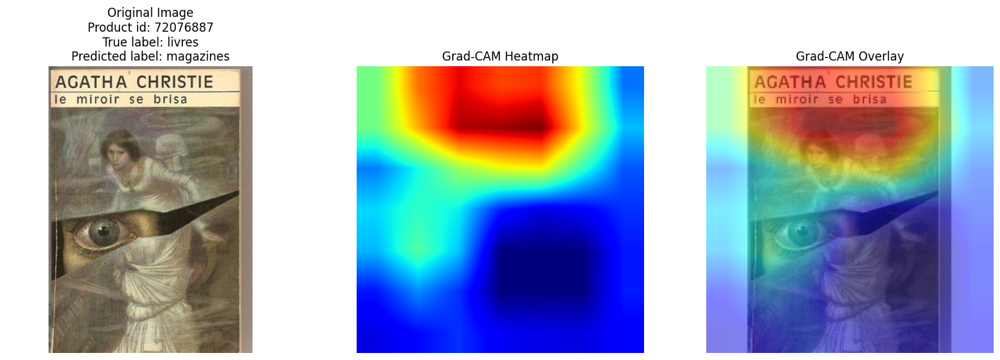

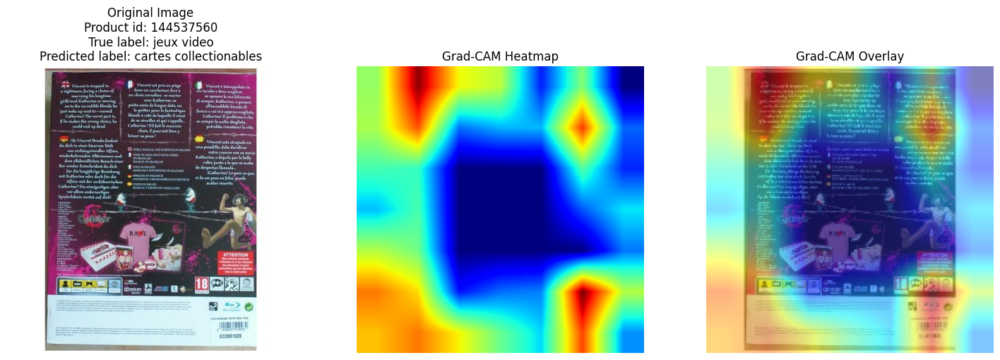

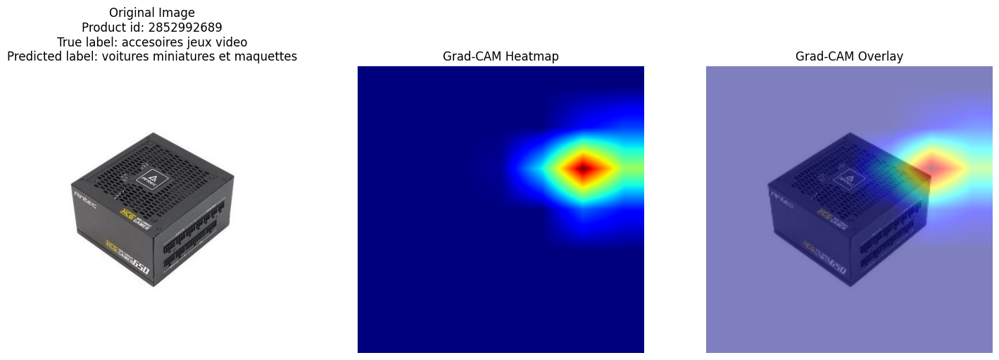

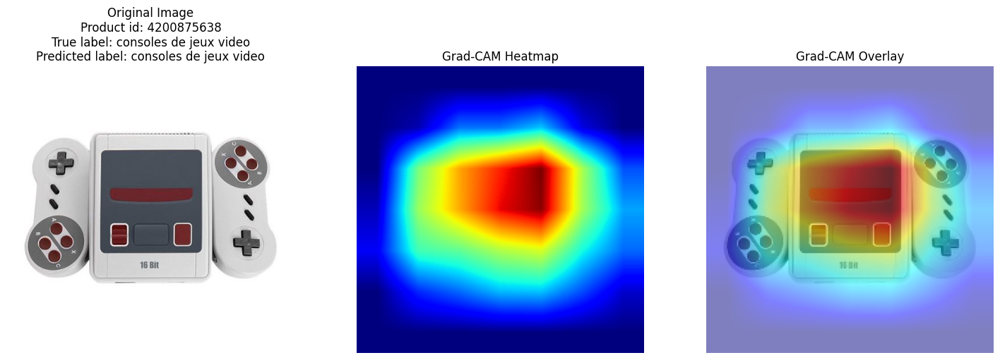

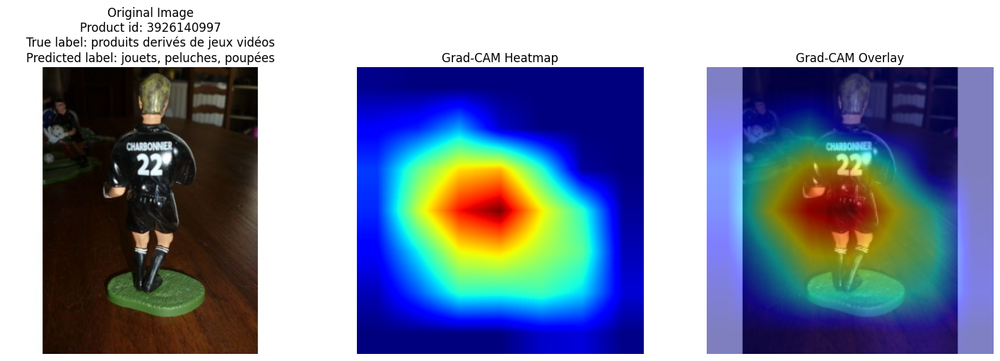

...

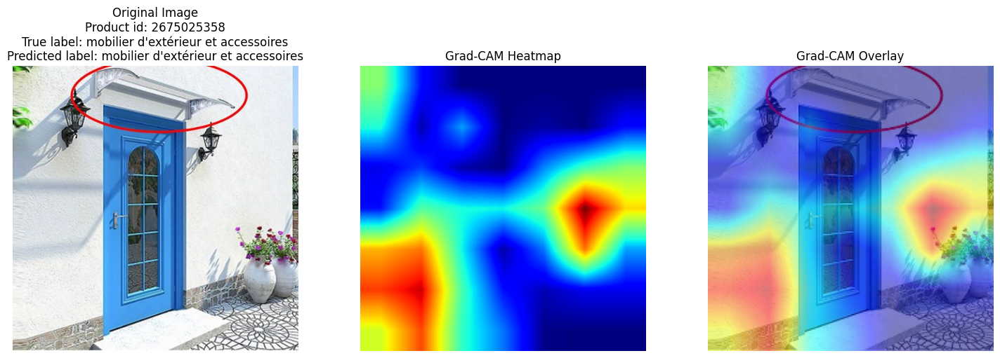

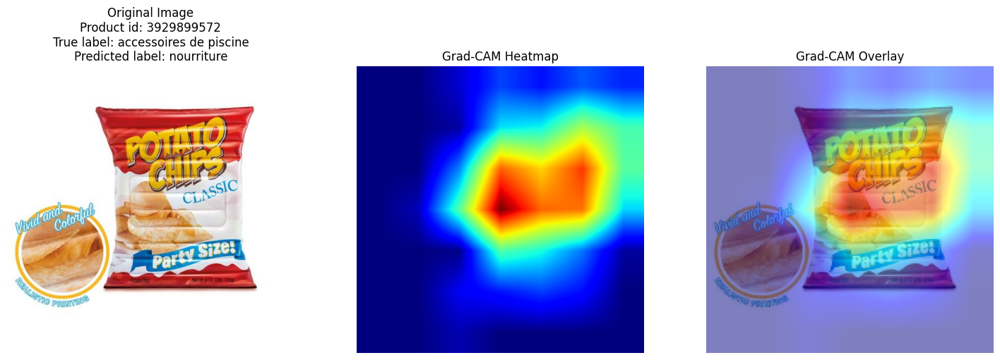

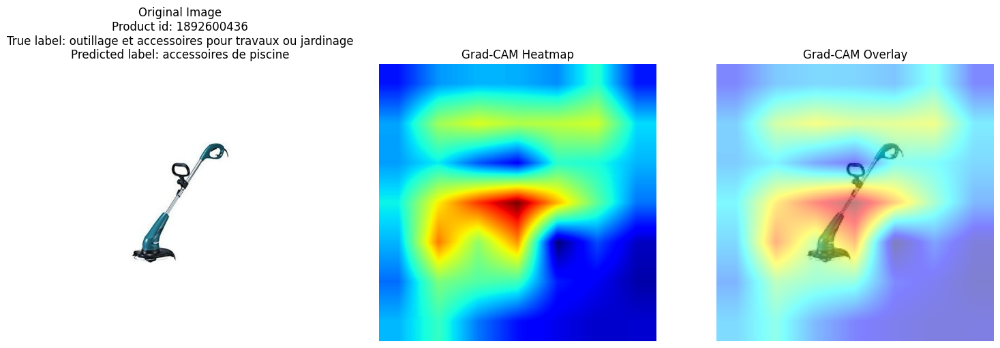

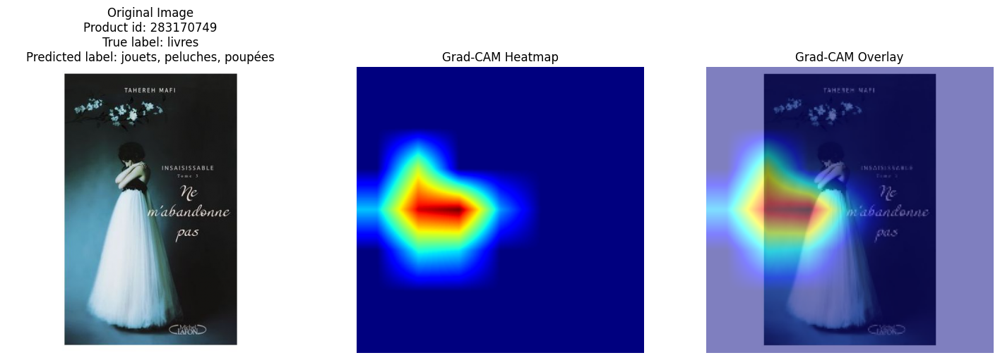

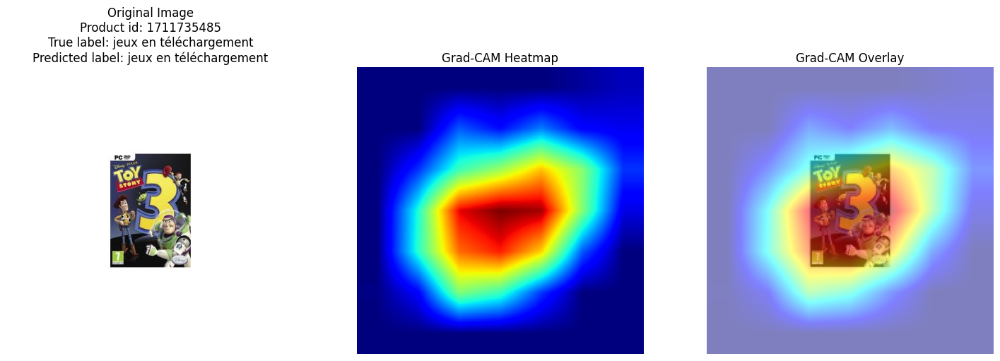

In [ ]:
# import saved resnet_model.pkl
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# For Grad-CAM inference - load and unfreeze
model = models.resnet18(weights=None)  # Don't load pretrained weights
model.fc = nn.Linear(model.fc.in_features, len(le.classes_))
model.load_state_dict(torch.load(os.path.join(MODELS_DIR, 'resnet_model.pth')))

# NOW enable gradients for Grad-CAM
for param in model.parameters():
    param.requires_grad = True
model.eval()  # Important for Grad-CAM

model = model.to(device)

# Define your preprocessing (adjust as needed)
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

def load_and_preprocess_image(img_path):
    img_tensor = preprocess(Image.open(img_path).convert("RGB"))
    img_tensor = img_tensor.to(device).float()
    img_tensor = img_tensor.unsqueeze(0)  # Add batch dimension
    return img_tensor

random_indices = (
    y_train.groupby('prdtypecode', group_keys=False)
    .apply(lambda x: x.sample(1))
    .index
    .tolist()
)

# Random selection of one index in y_train for each type of product code
for idx in random_indices:
    img_path = image_path(X_train.loc[idx, 'imageid'], X_train.loc[idx, 'productid'], split="train")
    rgb_img = plt.imread(img_path) / 255.0
    rgb_img_resized = cv2.resize(rgb_img, (224, 224))

    img_tensor = load_and_preprocess_image(img_path)

    target_layers = [model.layer4[-1]]
    cam = GradCAM(model=model, target_layers=target_layers)

    with torch.no_grad():
        output = model(img_tensor)
        predicted_class = output.argmax(dim=1).item()

    targets = [ClassifierOutputTarget(predicted_class)]

    # Get the heatmap
    grayscale_cam = cam(input_tensor=img_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :]  # Remove batch dimension

    # Create visualization
    visualization = show_cam_on_image(rgb_img_resized, grayscale_cam, use_rgb=True)

    # Get actual class names for better titles
    predicted_label = le.inverse_transform([predicted_class])[0]
    predicted_label = labels.loc[predicted_label, 'prdtypecode_label']
    true_label = y_train.loc[idx, 'prdtypecode_label']

    # Display the results
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Original image
    axes[0].imshow(rgb_img)
    axes[0].set_title(f'Original Image\nProduct id: {X_train.loc[idx, "productid"]}\nTrue label: {true_label}\nPredicted label: {predicted_label}')
    axes[0].axis('off')

    # Grad-CAM heatmap
    axes[1].imshow(grayscale_cam, cmap='jet')
    axes[1].set_title('Grad-CAM Heatmap')
    axes[1].axis('off')

    # Overlay
    axes[2].imshow(visualization)
    axes[2].set_title(f'Grad-CAM Overlay')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

    
